In [178]:
import pandas as pd
from time import sleep
import time

import matplotlib.pyplot as plt

import numpy as np
from IPython import display
from IPython.display import display, clear_output
import IPython.display as ipd

from scipy.signal import spectrogram

import math
import cv2
import os
import ffmpeg

import random

13316436


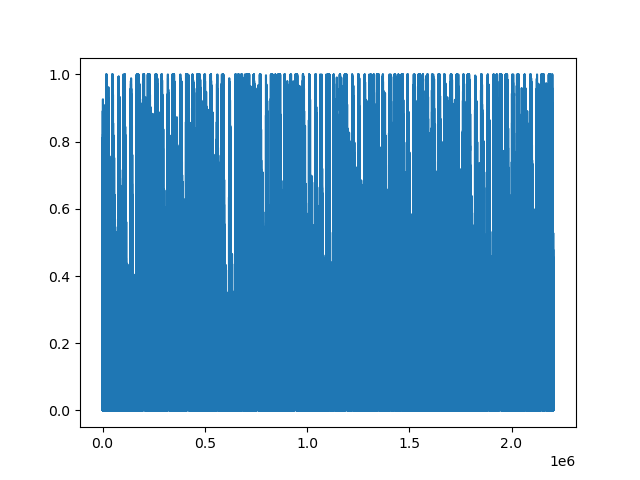

In [271]:
%matplotlib widget
plt.ion()
from audio2numpy import open_audio
fp = "SpoonInsideOut.wav"  # change to the correct path to your file accordingly
signal, sampling_rate = open_audio(fp)
print(len(signal))
timeseries = signal[ 50*sampling_rate : 100*sampling_rate , 0 ]
plt.plot(abs(timeseries))
ipd.Audio(timeseries, rate=sampling_rate, autoplay=True) 

In [273]:
f, t, Sxx = spectrogram(timeseries, 1/(sampling_rate), nperseg=1000, noverlap=100)  # window=('gaussian', 1/100000)

2449


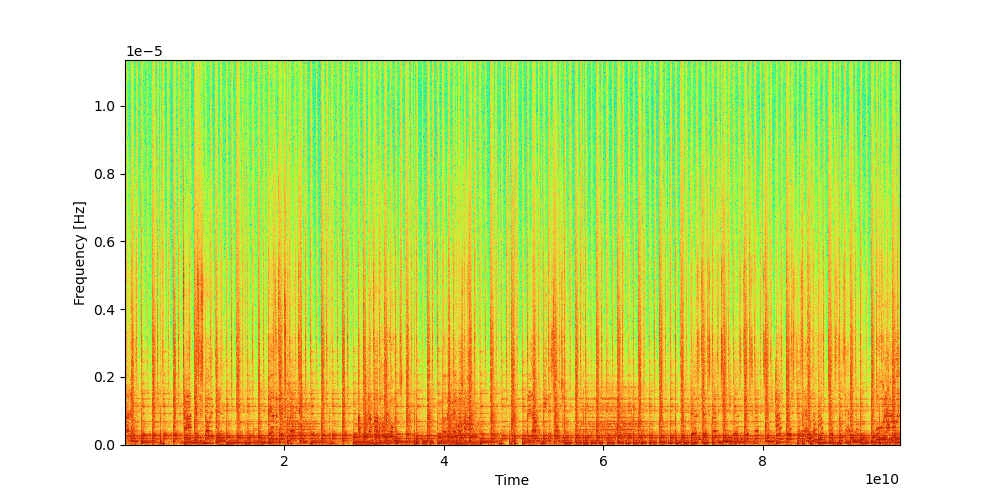

In [274]:
plt.figure(figsize=(10,5))
plt.pcolormesh(t, f, np.log(Sxx), cmap='turbo')
print(len(t))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time')
#plt.ylim((0,4000))
plt.show()

In [32]:
# f = f[1:100]
# Sxx = Sxx[1:100,:]

# amps = np.sum(Sxx, axis=1)
# amps = np.where(amps>10000000,1,0)

# newSeries = []

# samplesPerSec = int(len(t)/62)
# print(samplesPerSec)

# for i in range(0,len(t)):
#     sumAtTime = (np.nan_to_num( np.multiply(amps, np.sin( np.multiply(1/f,i) ) ) )).sum()
#     newSeries.append(sumAtTime)
    

263


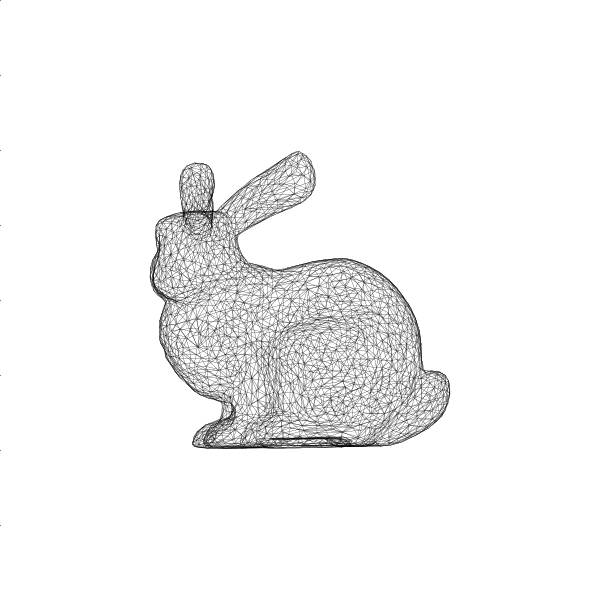

In [239]:
from matplotlib.collections import PolyCollection

V, F = [], []
# https://graphics.stanford.edu/~mdfisher/Data/Meshes/bunny.obj
with open("bunny.obj") as f:
   for line in f.readlines():
       if line.startswith('#'):
           continue
       values = line.split()
       if not values:
           continue
       if values[0] == 'v':
           V.append([float(x) for x in values[1:4]])
       elif values[0] == 'f':
           F.append([int(x) for x in values[1:4]])

V, F = np.array(V), np.array(F)-1

V = (V-(V.max(0)+V.min(0))/2)/max(V.max(0)-V.min(0))

T = V[F][...,:2]

fig = plt.figure(figsize=(6,6))
ax = fig.add_axes([0,0,1,1], xlim=[-1,+1], ylim=[-1,+1],
                  aspect=1, frameon=False)
collection = PolyCollection(T, closed=True, linewidth=0.1,
                            facecolor="None", edgecolor="black")
ax.add_collection(collection)
plt.show()


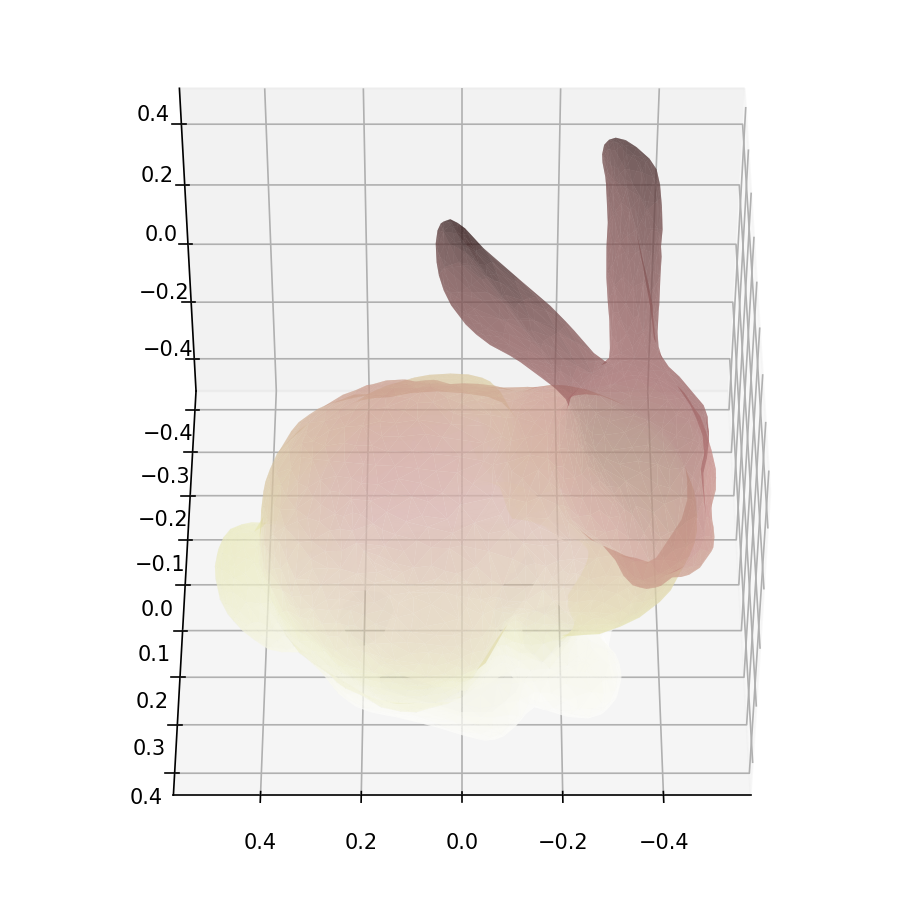

In [259]:
%matplotlib widget
plt.ion()

fig = plt.figure(figsize=(6,6), dpi=150, constrained_layout=True)

ax = fig.add_subplot(1,1,1,projection='3d')

x = V[:,0]
z = V[:,1]
y = V[:,2]

ax.plot_trisurf(x, y, z, triangles=F, linewidth=10, cmap='pink_r', alpha=0.5)
ax.view_init(45, 90)  

plt.show()

In [276]:
ipd.Audio(timeseries, rate=sampling_rate, autoplay=True)

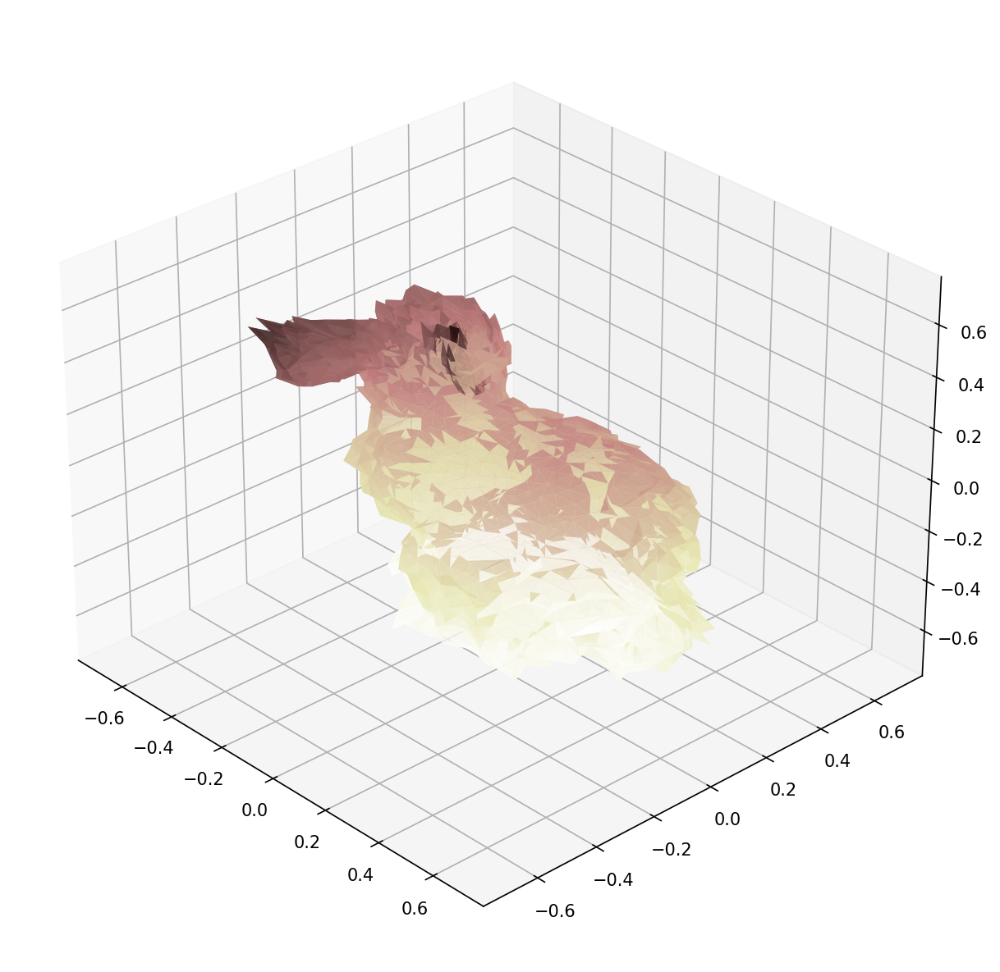

In [ ]:
%matplotlib widget

plt.ion()

fig = plt.figure(figsize=(10,10), dpi=150)#, constrained_layout=True)
ax = fig.add_subplot(1,1,1,projection='3d')

x = V[:,0]
z = V[:,1]
y = V[:,2]

trisurf = ax.plot_trisurf(x, y, z, triangles=F, cmap='bone')
  

startTime = time.time()
#print(startTime)

j = 0
ax.view_init(0, j) 

# while j<len(Sxx):
#     secEllapsed = time.time() - startTime
#     i = int(math.ceil(secEllapsed/37)*len(Sxx))
#     #print(i)
#     j = i

size = 0.75
ax.set_xlim((-size,size))
ax.set_ylim((-size,size))
ax.set_zlim((-size,size))

zArgSort = np.argsort(z)

for i in range(0,len(Sxx[:,0]),3):
    
    response = np.log(Sxx[:,i]/f)
    response[response==-np.inf] = 0
    response = np.repeat(response,math.ceil(len(z)/len(f)))[:len(z)]
    
    response = response[zArgSort]
    
#     response = sum(response)/len(response)
    
    xcopy = np.multiply(x.copy(),1+response/100)
    ycopy = np.multiply(y.copy(),1+response/100)
    zcopy = np.multiply(z.copy(),1+response/100)
    trisurf.remove()
    trisurf = ax.plot_trisurf(xcopy, ycopy, zcopy, triangles=F,  cmap='pink_r', alpha=0.8)

    fig.canvas.draw()  
    fig.canvas.flush_events()
    clear_output(wait=True)
    display(fig) 
    
    ax.view_init(math.sin(j/180)*30, j) 
    j+=1
    
    ###
    
    xcopy = x.copy()
    ycopy = y.copy()
    zcopy = z.copy() # np.multiply(z.copy(),1+response**0.25)
    trisurf.remove()
    trisurf = ax.plot_trisurf(xcopy, ycopy, zcopy, triangles=F,  cmap='pink_r', alpha=0.8)

    fig.canvas.draw()  
    fig.canvas.flush_events()
    clear_output(wait=True)
    display(fig) 
    
    ax.view_init(math.sin(j/180)*30, j) 
    j+=1
